<a href="https://colab.research.google.com/github/aman-mishra-02/Machine-Learning/blob/main/tensorflow/tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [124]:
#!unzip "/content/drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Vision/"

## Import tensorflow ✅




In [125]:
import tensorflow as tf
import tensorflow_hub as hub


if( tf.config.list_logical_devices):
  print('Yess')
else:
  print('no')

Yess


## Getting Our Data Ready

Turning images into tensors

In [126]:
import pandas as pd
label = pd.read_csv('/content/drive/MyDrive/Dog-Vision/labels.csv')
label.describe()


,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [127]:
label.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

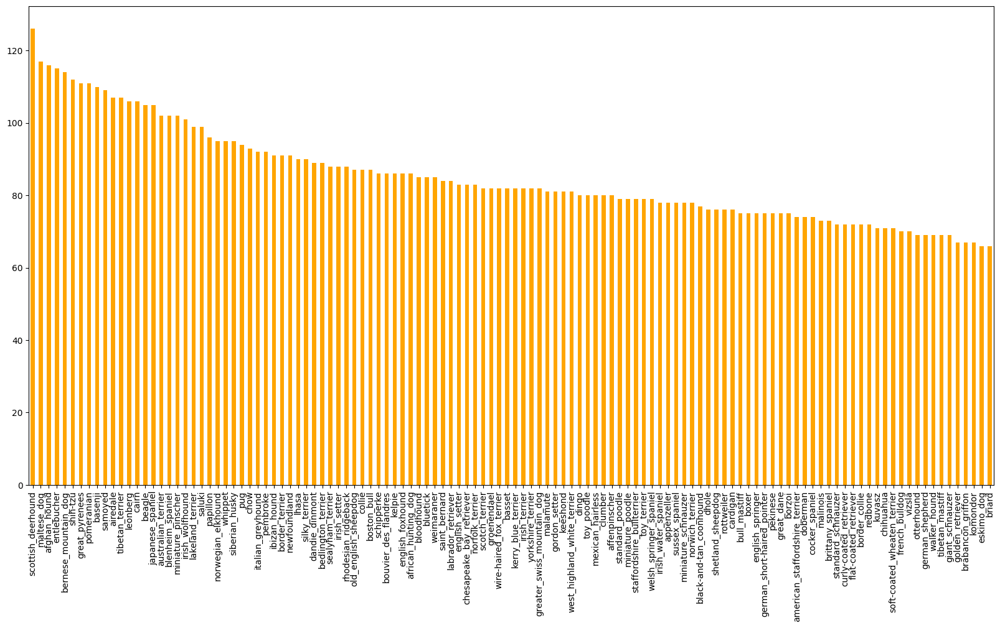

In [128]:
label['breed'].value_counts().plot.bar(figsize=(20,10),color='orange')

In [129]:
from IPython.display import Image

In [130]:
#Image('drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg')

In [131]:
label

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [132]:
filenames = ['drive/MyDrive/Dog-Vision/train/' + i + '.jpg' for i in label["id"]]

In [133]:
len(os.listdir('drive/MyDrive/Dog-Vision/train/'))

10222

In [134]:
len(filenames)

10222

In [135]:
#Image(filenames[4500])

In [136]:
label['breed'][4500]

'keeshond'

In [137]:
import numpy as np
labels = label['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [138]:
unique_breeds = np.unique(labels)


In [139]:
boolean_label = [l == unique_breeds for l in labels ]


In [140]:
len(boolean_label)

10222

### Creeating Validation set

In [141]:
X = filenames
y = boolean_label

In [142]:
NUM_IMAGES = 1000 # @param {type:'slider', min:1000, max:10000, step:1000}

In [143]:
from sklearn.model_selection import train_test_split
Xtrain,Xval,ytrain,yval = train_test_split(X[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                            test_size=0.2,
                                            random_state=42)

## Preprocessing Images(Turning images into tensor)

In [144]:
IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image,tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image

In [145]:
x= process_image(X[40])
x.shape

TensorShape([224, 224, 3])

## Turning Data into Batches

In [146]:
def get_image_label(image_path,label):
  return process_image(image_path), label

In [147]:
#get_image_label(X[40],y[40])

In [148]:
BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print('Creating Test Batches ...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('Creating Validation Batches ...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating Train Batches ...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [149]:
train_data = create_data_batches(Xtrain,ytrain)
val_data = create_data_batches(Xval,yval, valid_data=True)

Creating Train Batches ...
Creating Validation Batches ...


In [150]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [151]:
import matplotlib.pyplot as plt

def show_30_images(images, labels):
  plt.figure(figsize=(10,12))
  for i in range(30):
    ax = plt.subplot(5,6,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')



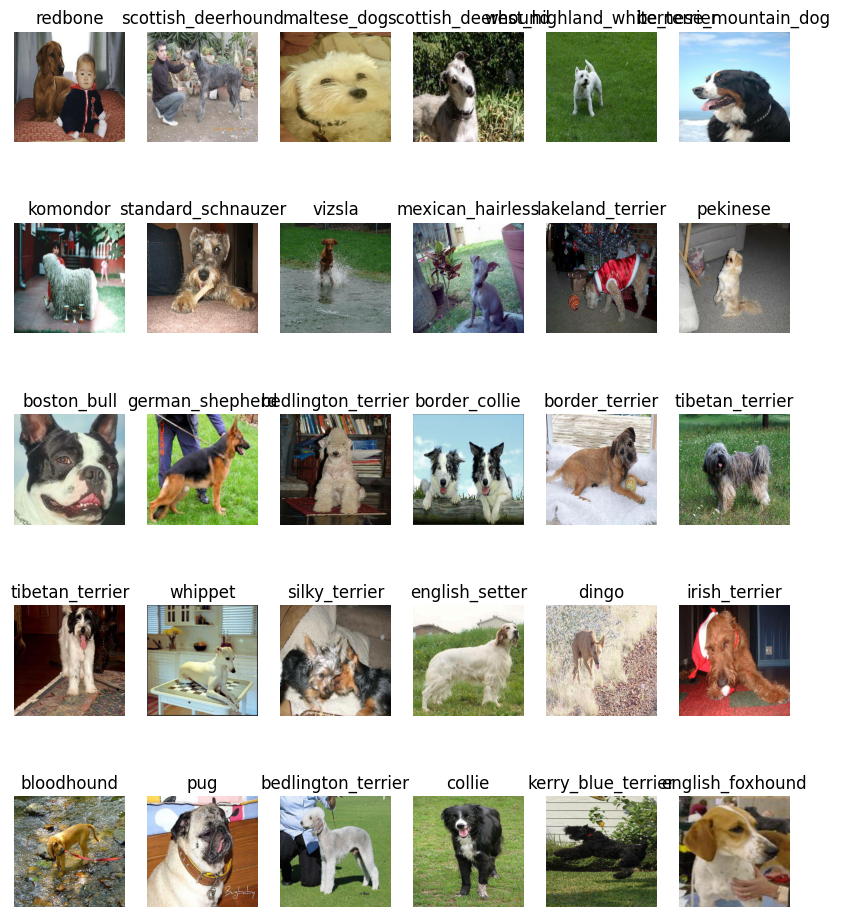

In [152]:
train_images , train_labels = next(train_data.as_numpy_iterator())
show_30_images(train_images, train_labels)

## Building Model

In [153]:
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [154]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Creating Model ... ")
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax')
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(INPUT_SHAPE)

  return model



In [155]:
model = create_model()
model.summary()

Creating Model ... 
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
<ul>
<li>TensorBoard :- tracks our models progress
<li>Early Stoping :- Prevent Overfitting
</Ul>

In [156]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [157]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog-Vision/log",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                        )
  return tf.keras.callbacks.TensorBoard(logdir)


In [158]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                                  patience=2)

In [159]:
NUM_EPOCHS = 100 #@param{type:'slider', min:10, max:150, step:10}

## Train Model

In [160]:
## function which create and return trained model

def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [161]:
model = train_model()

Creating Model ... 
Epoch 1/100
25/25 [==============================] - 13s 321ms/step - loss: 4.5788 - accuracy: 0.0913 - val_loss: 3.5300 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 3s 120ms/step - loss: 1.6428 - accuracy: 0.6925 - val_loss: 2.2210 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 146ms/step - loss: 0.5672 - accuracy: 0.9337 - val_loss: 1.7707 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2489 - accuracy: 0.9887 - val_loss: 1.5655 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1459 - accuracy: 0.9987 - val_loss: 1.4864 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 143ms/step - loss: 0.0998 - accuracy: 1.0000 - val_loss: 1.4393 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 5s 181ms/step - loss: 0.0756 - accuracy: 1.0000 - val_loss: 1.4028 -

In [162]:
%tensorboard --logdir /content/drive/MyDrive/Dog-Vision/log

Reusing TensorBoard on port 6006 (pid 16225), started 1:00:59 ago. (Use '!kill 16225' to kill it.)

<IPython.core.display.Javascript object>

In [176]:
prediction = model.predict(val_data,)

7/7 [==============================] - 1s 150ms/step


In [177]:
index = 42
print(np.max(prediction[index]))
print(np.argmax(prediction[index]))
print(unique_breeds[np.argmax(prediction[index])])

0.841929
113
walker_hound


In [178]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


In [179]:
pred_label = []
for i in range(len(unique_breeds)):
  pred_label.append(get_pred_label(prediction[i]))
pred_label

['irish_wolfhound',
 'scotch_terrier',
 'basset',
 'lakeland_terrier',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'collie',
 'lakeland_terrier',
 'saint_bernard',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'miniature_poodle',
 'irish_setter',
 'african_hunting_dog',
 'labrador_retriever',
 'irish_water_spaniel',
 'collie',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'irish_wolfhound',
 'komondor',
 'cairn',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'cairn',
 'malamute',
 'malamute',
 'welsh_springer_spaniel',
 'doberman',
 'dhole',
 'labrador_retriever',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'walker_hound',
 'border_collie',
 'miniature_poodle',
 'groenendael',
 'boston_bull',
 'miniature_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'redbone',
 'norfolk_terrier',
 'pug',
 'toy_poodle',
 'affenpinscher',
 'border_terrier

In [182]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [183]:
images_,labels_ = unbatchify(val_data)

In [180]:
get_pred_label(labels_[0])

'cairn'

In [193]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  '''
  view the prediction
  '''
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color='green'
  else:
    color='red'

  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)
  pass

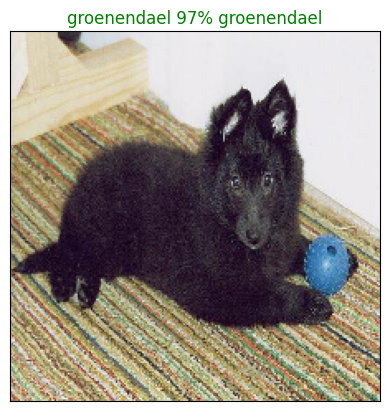

In [195]:
plot_pred(prediction_probabilities=prediction,
          labels=labels_,
          images=images_,
          n=77)

In [199]:
# top 10 prediction

def plot_top_10(prediction_probabilities, labels, n=1):
  pred_prob,true_label = prediction_probabilities[n], labels[n]

  pred_label=get_pred_label(prediction[i])

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

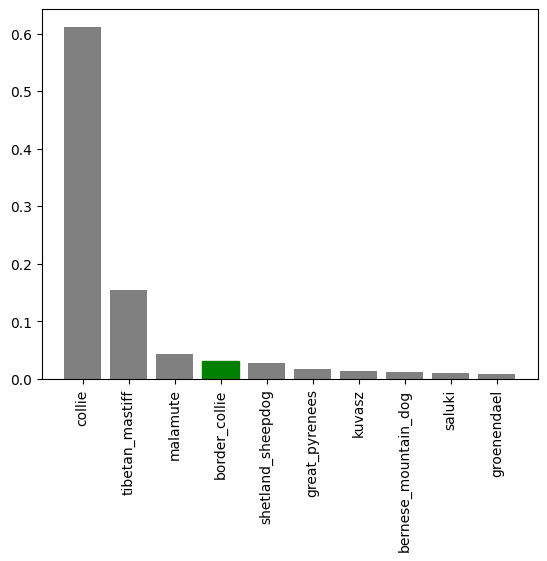

In [203]:
plot_top_10(prediction_probabilities=prediction,
            labels=labels_,
            n=9)

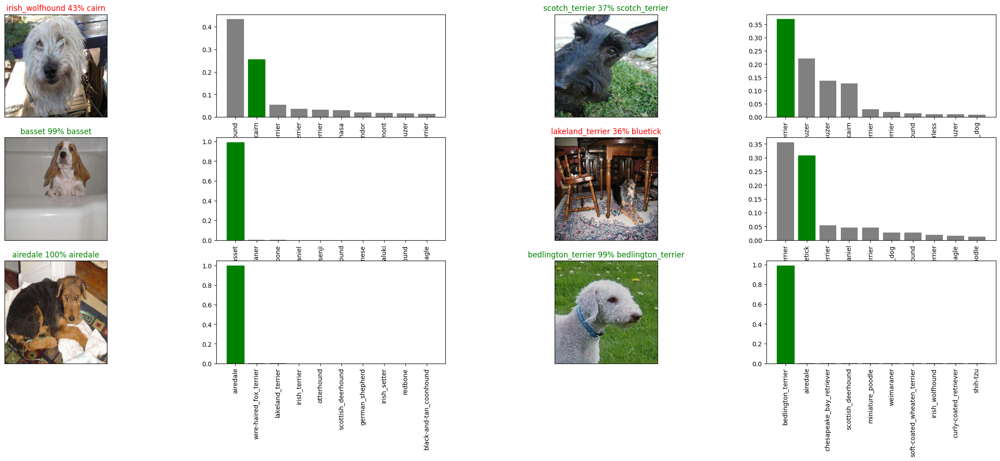

In [215]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_img = num_rows*num_cols
plt.figure(figsize=(10*num_rows,5*num_cols))
for i in range(num_img):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=labels_,
            images=images_,
            n= i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_top_10(prediction_probabilities=prediction,
            labels=labels_,
            n=i+i_multiplier)
# plt.tight_layout(h_pad=1.0)
plt.show()